In [48]:
import warnings
warnings.filterwarnings('default')

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

from pandas_profiling import profile_report

from sklearn.model_selection import train_test_split, cross_val_score, KFold, GridSearchCV, RandomizedSearchCV
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.linear_model import LinearRegression, RidgeCV, LassoCV, ElasticNetCV
from sklearn.tree import DecisionTreeRegressor

from sklearn.metrics import mean_squared_error,r2_score
from sklearn.ensemble import RandomForestRegressor , AdaBoostRegressor, BaggingRegressor, GradientBoostingRegressor
from sklearn.pipeline import Pipeline

import plotly.express as px



In [3]:
from IPython.core.display import display, HTML
display(HTML('<style>.container{width:98% ! important;}</style>'))

plt.style.use('ggplot')
plt.rcParams['figure.figsize'] = [15,8]
pd.set_option('display.max_columns',500)
pd.set_option('display.max_row',500)

In [4]:
df = pd.read_csv("concrete.csv")
df.head()

,cement,slag,ash,water,superplastic,coarseagg,fineagg,age,strength
0,141.3,212.0,0.0,203.5,0.0,971.8,748.5,28,29.89
1,168.9,42.2,124.3,158.3,10.8,1080.8,796.2,14,23.51
2,250.0,0.0,95.7,187.4,5.5,956.9,861.2,28,29.22
3,266.0,114.0,0.0,228.0,0.0,932.0,670.0,28,45.85
4,154.8,183.4,0.0,193.3,9.1,1047.4,696.7,28,18.29


In [5]:
df.shape

(1030, 9)

## EDA

### Univariate Analysis

In [6]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
cement,1030.0,281.167864,104.506364,102.00,192.375,272.900,350.000,540.0
slag,1030.0,73.895825,86.279342,0.00,0.000,22.000,142.950,359.4
ash,1030.0,54.188350,63.997004,0.00,0.000,0.000,118.300,200.1
water,1030.0,181.567282,21.354219,121.80,164.900,185.000,192.000,247.0
superplastic,1030.0,6.204660,5.973841,0.00,0.000,6.400,10.200,32.2
coarseagg,1030.0,972.918932,77.753954,801.00,932.000,968.000,1029.400,1145.0
fineagg,1030.0,773.580485,80.175980,594.00,730.950,779.500,824.000,992.6
age,1030.0,45.662136,63.169912,1.00,7.000,28.000,56.000,365.0
strength,1030.0,35.817961,16.705742,2.33,23.710,34.445,46.135,82.6


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1030 entries, 0 to 1029
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   cement        1030 non-null   float64
 1   slag          1030 non-null   float64
 2   ash           1030 non-null   float64
 3   water         1030 non-null   float64
 4   superplastic  1030 non-null   float64
 5   coarseagg     1030 non-null   float64
 6   fineagg       1030 non-null   float64
 7   age           1030 non-null   int64  
 8   strength      1030 non-null   float64
dtypes: float64(8), int64(1)
memory usage: 72.5 KB


In [8]:
profile = df.profile_report(html={'style':{'full_width': True}})
profile

In [9]:
#Check for duplicte rows
df.duplicated().sum()

25

In [10]:
df.describe()

,cement,slag,ash,water,superplastic,coarseagg,fineagg,age,strength
count,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000
mean,281.167864,73.895825,54.188350,181.567282,6.204660,972.918932,773.580485,45.662136,35.817961
std,104.506364,86.279342,63.997004,21.354219,5.973841,77.753954,80.175980,63.169912,16.705742
min,102.000000,0.000000,0.000000,121.800000,0.000000,801.000000,594.000000,1.000000,2.330000
25%,192.375000,0.000000,0.000000,164.900000,0.000000,932.000000,730.950000,7.000000,23.710000
50%,272.900000,22.000000,0.000000,185.000000,6.400000,968.000000,779.500000,28.000000,34.445000
75%,350.000000,142.950000,118.300000,192.000000,10.200000,1029.400000,824.000000,56.000000,46.135000
max,540.000000,359.400000,200.100000,247.000000,32.200000,1145.000000,992.600000,365.000000,82.600000


In [11]:
# df['age'] = np.log(df['age'])

### 2. Bi-variate analysis 

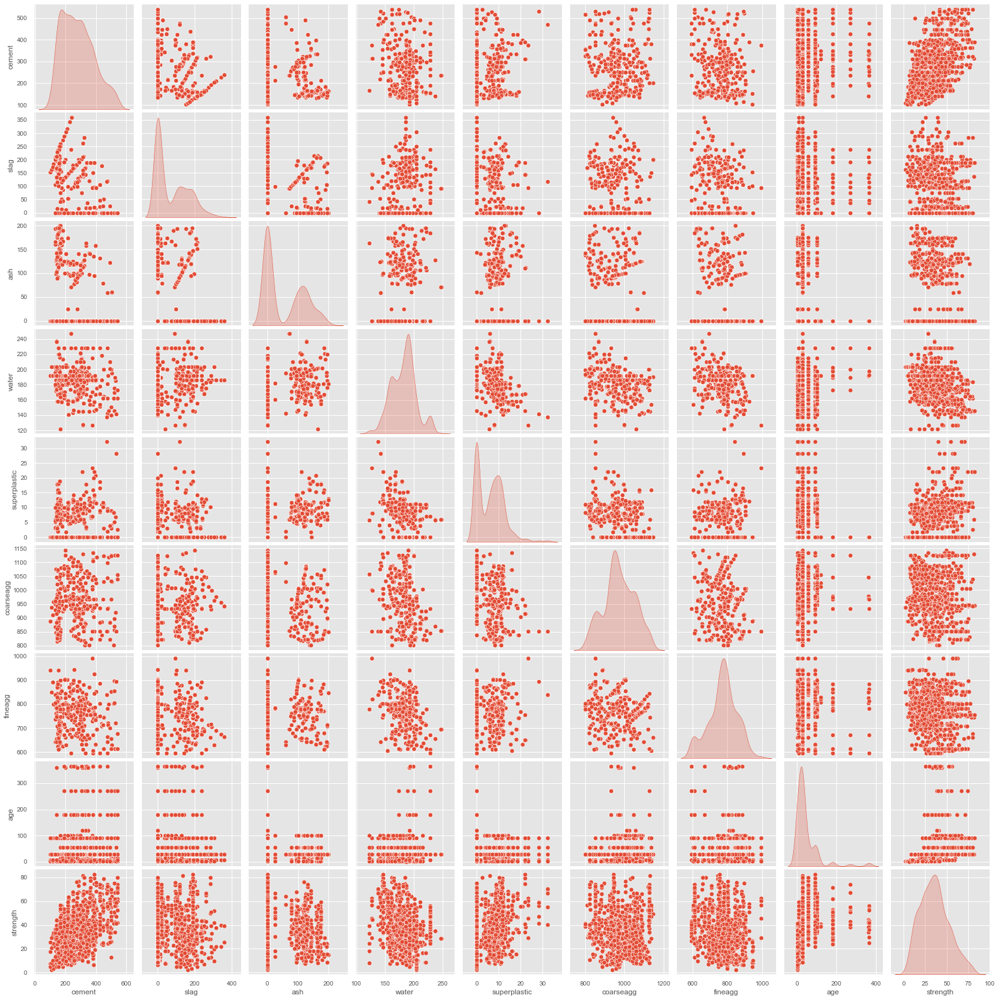

In [12]:
# Pairplot using sns
sns.pairplot(df , diag_kind = 'kde')
plt.show()

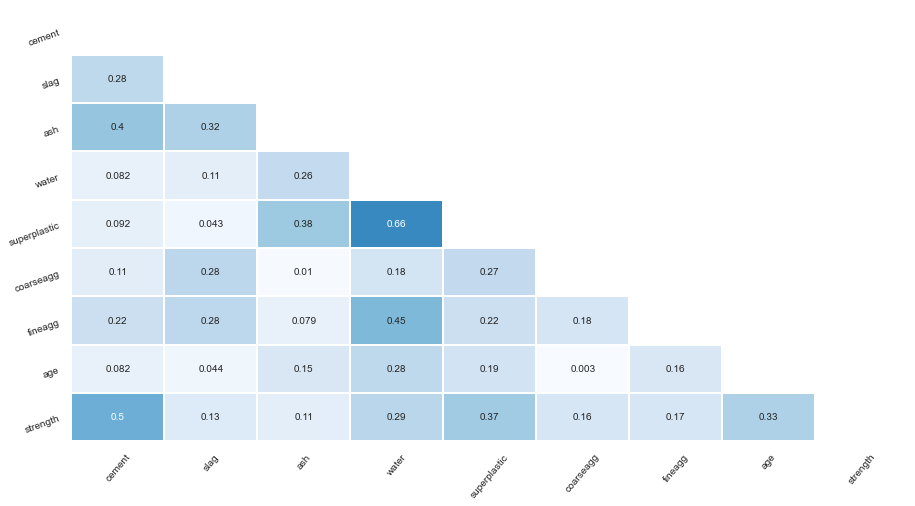

In [13]:
corr = abs(df.corr()) # correlation matrix
lower_triangle = np.tril(corr, k = -1)  # select only the lower triangle of the correlation matrix
mask = lower_triangle == 0  # to mask the upper triangle in the following heatmap

plt.figure(figsize = (15,8))  # setting the figure size
sns.set_style(style = 'white')  # Setting it to white so that we do not see the grid lines
sns.heatmap(lower_triangle, center=0.5, cmap= 'Blues', annot= True, xticklabels = corr.index, yticklabels = corr.columns,
            cbar= False, linewidths= 1, mask = mask)   # Da Heatmap
plt.xticks(rotation = 50)   # Aesthetic purposes
plt.yticks(rotation = 20)   # Aesthetic purposes
plt.show()

### Data prep for Baseline Models

In [14]:
# Separating dependent and independent variables
x = df.drop('strength',axis=1)
y = df['strength']
# Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(x,y,test_size=0.3,random_state=7)

In [15]:
algos_list = [['Ridge Regression', RidgeCV()],
              ['Lasso Regression', LassoCV()],
              ['Decision Tree Regressor', DecisionTreeRegressor(random_state=7)],
              ['Random Forest Regressor', RandomForestRegressor(random_state=7)],
              ['AdaBoost Regressor', AdaBoostRegressor(random_state=7)],
              ['Bagging Regressor', BaggingRegressor(random_state=7)],
              ['Gradient Boosting Regressor', GradientBoostingRegressor(random_state=7)],
              ]

In [16]:
result = pd.DataFrame({
                'Algo' : [],
                'R2 Train' : [],
                'R2 Test' : [],
                'MAPE Train': [],
                'MAPE Test': [],
                'RMSE Train' : [],
                'RMSE Test' : []
}
)

In [17]:
# MAPE 

In [18]:
def try_models(models_to_try):
    for name, model in models_to_try:
        print(name)
        model.fit(X_train,y_train)
        result.loc[len(result)] = [name,
                                   r2_score(y_train,model.predict(X_train)), # R2 on train
                                   r2_score(y_test,model.predict(X_test)),  # R2 on test
                                   np.mean(np.abs((y_train - model.predict(X_train))/y_train))*100, # Mean Absolute Percentage Error on Train
#mean_absolute_percentage_error(y_train, model.predict(X_train)),
                                   np.mean(np.abs((y_test - model.predict(X_test))/y_test))*100,  # Mean Absolute Percentage Error on Test
                                   mean_squared_error(y_train, model.predict(X_train), squared=False), # RMSE Train
                                   mean_squared_error(y_test, model.predict(X_test), squared=False)  # RMSE Test
        ]
        
def evaluate_model(model):
    r2_train = r2_score(y_train,model.predict(X_train)), # R2 on train
    r2_test = r2_score(y_test,model.predict(X_test)),  # R2 on test
    mape_train = np.mean(np.abs((y_train - model.predict(X_train))/y_train))*100, # Mean Absolute Percentage Error on Train
    #mean_absolute_percentage_error(y_train, model.predict(X_train)),
    mape_test = np.mean(np.abs((y_test - model.predict(X_test))/y_test))*100,  # Mean Absolute Percentage Error on Test
    rmse_train = mean_squared_error(y_train, model.predict(X_train), squared=False), # RMSE Train
    rmse_test = mean_squared_error(y_test, model.predict(X_test), squared=False)  # RMSE Test
    return r2_train, r2_test, mape_train, mape_test, rmse_train, rmse_test


def show_imp_features(model, label):
    # View a list of the features and their importance scores
    importances = dict(zip(X_train.columns, model.feature_importances_))
    importances = pd.DataFrame.from_dict(importances,orient='index').reset_index()
    importances = importances.rename(columns={'index':'Feature',0:'Importance'})
    importances['Importance'] = round(importances['Importance']*100,1)
    imp = importances.sort_values('Importance')
    
    fig = px.bar(imp, y ='Feature', x='Importance',orientation='h', text='Importance', title = label+ ': Feature Importance',
                height = 500, width = 1300)
    fig.update_traces(texttemplate='%{text:.1f}',textposition='outside')
    fig.show()

In [19]:
try_models(algos_list)

Ridge Regression
Lasso Regression
Decision Tree Regressor
Random Forest Regressor
AdaBoost Regressor
Bagging Regressor
Gradient Boosting Regressor


In [20]:
result.head(15)

,Algo,R2 Train,R2 Test,MAPE Train,MAPE Test,RMSE Train,RMSE Test
0,Ridge Regression,0.610861,0.622883,31.263738,31.375647,10.575603,9.874980
1,Lasso Regression,0.610690,0.622909,31.365905,31.463697,10.577934,9.874637
2,Decision Tree Regressor,0.995373,0.843872,0.353270,15.116217,1.153254,6.353874
3,Random Forest Regressor,0.981869,0.913903,5.030530,12.759460,2.282749,4.718377
4,AdaBoost Regressor,0.810355,0.756508,25.994860,27.961095,7.382848,7.934877
5,Bagging Regressor,0.975955,0.909792,5.850795,13.374157,2.628824,4.829694
6,Gradient Boosting Regressor,0.950424,0.916838,9.799887,12.420850,3.774749,4.637256


In [21]:
show_imp_features(GradientBoostingRegressor(random_state=7).fit(X_train,y_train),'Gradient Boosting Regressor')

### 3. Feature Engineering techniques

In [22]:
df.head()

,cement,slag,ash,water,superplastic,coarseagg,fineagg,age,strength
0,141.3,212.0,0.0,203.5,0.0,971.8,748.5,28,29.89
1,168.9,42.2,124.3,158.3,10.8,1080.8,796.2,14,23.51
2,250.0,0.0,95.7,187.4,5.5,956.9,861.2,28,29.22
3,266.0,114.0,0.0,228.0,0.0,932.0,670.0,28,45.85
4,154.8,183.4,0.0,193.3,9.1,1047.4,696.7,28,18.29


In [23]:
df['water_cement_ratio'] = df['water']/df['cement']  # Extracting a new column
df['water_age_ratio'] = df['water']/df['age'] 

In [24]:
# df['coarseagg:fineagg'] = df['coarseagg'] / df['fineagg'] # Extracting a new column

In [25]:
# Remving duplicates
# df = df.drop_duplicates()

In [26]:
# Separating dependent and independent variables
x = df.drop(['strength','water','age','cement'],axis=1)
y = df['strength']
# Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(x,y,test_size=0.3,random_state=7)

In [27]:
show_imp_features(GradientBoostingRegressor(random_state=7).fit(X_train,y_train),'Gradient Boosting Regressor')

In [43]:
model = GradientBoostingRegressor()
model.fit(X_train,y_train)
model.feature_importances_

array([0.07513396, 0.01072593, 0.03060267, 0.02531249, 0.03683603,
       0.32130294, 0.50008597])

In [44]:
X_train.columns

Index(['slag', 'ash', 'superplastic', 'coarseagg', 'fineagg',
       'water_cement_ratio', 'water_age_ratio'],
      dtype='object')

### Cross validate the models

In [28]:
k =  KFold(random_state=7,n_splits=5)

# KFold will split the data in 5 equal parts

In [29]:
# Linear Regression

pipeline = Pipeline([
    ('scaler',StandardScaler()),
    ('poly',PolynomialFeatures(degree=2, interaction_only = True)),
    ('reg', GradientBoostingRegressor())
])


pipeline.fit(X_train,y_train)
print(pipeline.score(X_train,y_train))

print(pipeline.score(X_test,y_test))

0.9611715810815348
0.9137947579121041


In [45]:

pipeline = Pipeline([
    ('scaler',StandardScaler()),
    ('poly',PolynomialFeatures(degree=3, interaction_only = True)),
    ('reg', GradientBoostingRegressor())
])


pipeline.fit(X_train,y_train)
print(pipeline.score(X_train,y_train))

print(pipeline.score(X_test,y_test))

0.9649716279430931
0.9109135817267712


In [46]:

pipeline = Pipeline([
    ('scaler',StandardScaler()),
    ('poly',PolynomialFeatures(degree=4, interaction_only = True)),
    ('reg', GradientBoostingRegressor())
])


pipeline.fit(X_train,y_train)
print(pipeline.score(X_train,y_train))

print(pipeline.score(X_test,y_test))

0.9673205516948146
0.9038003219768023


### 2. Hyper Parameter Tuning 

**Grid Search on Random Forest**

In [49]:
rf = RandomForestRegressor(random_state=7)

params = {
    'bootstrap': [True,False],
    'max_depth': [3,4,None],
    'max_features': ['sqrt','log2'],
    'min_samples_leaf': [1,3,4],
    'min_samples_split': [2,3,5],
    'n_estimators': [25,50,100]
}    

rf_cv = GridSearchCV(estimator = rf, param_grid = params, cv = k)

rf_cv.fit(X_train,y_train)

print(rf_cv.score(X_train,y_train))

print(rf_cv.score(X_test,y_test))

#check for best parameters
rf_cv.best_params_

C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 348, in fit
    self._validate_estimator()
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_base.py", line 131, in _validate_estimator
    "got {0}.".format(type(self.n_estimators)))
ValueError: n_estimators must be an integer, got <class 'str'>.


C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: 

C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 348, in fit
    self._validate_estimator()
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_base.py", line 131, in _validate_estimator
    "got {0}.".format(type(self.n_estimators)))
ValueError: n_estimators must be an integer, got <class 'str'>.


C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: 

C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 348, in fit
    self._validate_estimator()
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_base.py", line 131, in _validate_estimator
    "got {0}.".format(type(self.n_estimators)))
ValueError: n_estimators must be an integer, got <class 'str'>.


C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: 

C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 348, in fit
    self._validate_estimator()
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_base.py", line 131, in _validate_estimator
    "got {0}.".format(type(self.n_estimators)))
ValueError: n_estimators must be an integer, got <class 'str'>.


C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: 

C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 348, in fit
    self._validate_estimator()
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_base.py", line 131, in _validate_estimator
    "got {0}.".format(type(self.n_estimators)))
ValueError: n_estimators must be an integer, got <class 'str'>.


C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: 

C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 348, in fit
    self._validate_estimator()
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_base.py", line 131, in _validate_estimator
    "got {0}.".format(type(self.n_estimators)))
ValueError: n_estimators must be an integer, got <class 'str'>.


C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: 

C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 348, in fit
    self._validate_estimator()
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_base.py", line 131, in _validate_estimator
    "got {0}.".format(type(self.n_estimators)))
ValueError: n_estimators must be an integer, got <class 'str'>.


C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: 

C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 348, in fit
    self._validate_estimator()
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_base.py", line 131, in _validate_estimator
    "got {0}.".format(type(self.n_estimators)))
ValueError: n_estimators must be an integer, got <class 'str'>.


C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: 

C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 348, in fit
    self._validate_estimator()
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_base.py", line 131, in _validate_estimator
    "got {0}.".format(type(self.n_estimators)))
ValueError: n_estimators must be an integer, got <class 'str'>.


C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: 

C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 348, in fit
    self._validate_estimator()
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_base.py", line 131, in _validate_estimator
    "got {0}.".format(type(self.n_estimators)))
ValueError: n_estimators must be an integer, got <class 'str'>.


C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: 

C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 348, in fit
    self._validate_estimator()
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_base.py", line 131, in _validate_estimator
    "got {0}.".format(type(self.n_estimators)))
ValueError: n_estimators must be an integer, got <class 'str'>.


C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: 

C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 348, in fit
    self._validate_estimator()
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_base.py", line 131, in _validate_estimator
    "got {0}.".format(type(self.n_estimators)))
ValueError: n_estimators must be an integer, got <class 'str'>.


C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: 

C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 348, in fit
    self._validate_estimator()
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_base.py", line 131, in _validate_estimator
    "got {0}.".format(type(self.n_estimators)))
ValueError: n_estimators must be an integer, got <class 'str'>.


C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: 

C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 348, in fit
    self._validate_estimator()
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_base.py", line 131, in _validate_estimator
    "got {0}.".format(type(self.n_estimators)))
ValueError: n_estimators must be an integer, got <class 'str'>.


C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: 

C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 348, in fit
    self._validate_estimator()
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_base.py", line 131, in _validate_estimator
    "got {0}.".format(type(self.n_estimators)))
ValueError: n_estimators must be an integer, got <class 'str'>.


C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: 

C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 348, in fit
    self._validate_estimator()
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_base.py", line 131, in _validate_estimator
    "got {0}.".format(type(self.n_estimators)))
ValueError: n_estimators must be an integer, got <class 'str'>.


C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: 

C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 348, in fit
    self._validate_estimator()
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_base.py", line 131, in _validate_estimator
    "got {0}.".format(type(self.n_estimators)))
ValueError: n_estimators must be an integer, got <class 'str'>.


C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: 

C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 348, in fit
    self._validate_estimator()
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_base.py", line 131, in _validate_estimator
    "got {0}.".format(type(self.n_estimators)))
ValueError: n_estimators must be an integer, got <class 'str'>.


C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: 

C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 348, in fit
    self._validate_estimator()
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_base.py", line 131, in _validate_estimator
    "got {0}.".format(type(self.n_estimators)))
ValueError: n_estimators must be an integer, got <class 'str'>.


C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: 

C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 348, in fit
    self._validate_estimator()
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_base.py", line 131, in _validate_estimator
    "got {0}.".format(type(self.n_estimators)))
ValueError: n_estimators must be an integer, got <class 'str'>.


C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: 

C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 348, in fit
    self._validate_estimator()
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_base.py", line 131, in _validate_estimator
    "got {0}.".format(type(self.n_estimators)))
ValueError: n_estimators must be an integer, got <class 'str'>.


C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: 

C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 348, in fit
    self._validate_estimator()
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_base.py", line 131, in _validate_estimator
    "got {0}.".format(type(self.n_estimators)))
ValueError: n_estimators must be an integer, got <class 'str'>.


C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: 

C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 348, in fit
    self._validate_estimator()
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_base.py", line 131, in _validate_estimator
    "got {0}.".format(type(self.n_estimators)))
ValueError: n_estimators must be an integer, got <class 'str'>.


C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: 

C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 348, in fit
    self._validate_estimator()
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_base.py", line 131, in _validate_estimator
    "got {0}.".format(type(self.n_estimators)))
ValueError: n_estimators must be an integer, got <class 'str'>.


C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: 

C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 348, in fit
    self._validate_estimator()
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_base.py", line 131, in _validate_estimator
    "got {0}.".format(type(self.n_estimators)))
ValueError: n_estimators must be an integer, got <class 'str'>.


C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: 

C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 348, in fit
    self._validate_estimator()
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_base.py", line 131, in _validate_estimator
    "got {0}.".format(type(self.n_estimators)))
ValueError: n_estimators must be an integer, got <class 'str'>.


C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: 

C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 348, in fit
    self._validate_estimator()
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_base.py", line 131, in _validate_estimator
    "got {0}.".format(type(self.n_estimators)))
ValueError: n_estimators must be an integer, got <class 'str'>.


C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: 

C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 348, in fit
    self._validate_estimator()
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_base.py", line 131, in _validate_estimator
    "got {0}.".format(type(self.n_estimators)))
ValueError: n_estimators must be an integer, got <class 'str'>.


C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: 

C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 348, in fit
    self._validate_estimator()
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_base.py", line 131, in _validate_estimator
    "got {0}.".format(type(self.n_estimators)))
ValueError: n_estimators must be an integer, got <class 'str'>.


C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: 

C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 348, in fit
    self._validate_estimator()
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_base.py", line 131, in _validate_estimator
    "got {0}.".format(type(self.n_estimators)))
ValueError: n_estimators must be an integer, got <class 'str'>.


C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: 

C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 348, in fit
    self._validate_estimator()
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_base.py", line 131, in _validate_estimator
    "got {0}.".format(type(self.n_estimators)))
ValueError: n_estimators must be an integer, got <class 'str'>.


C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: 

C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 348, in fit
    self._validate_estimator()
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_base.py", line 131, in _validate_estimator
    "got {0}.".format(type(self.n_estimators)))
ValueError: n_estimators must be an integer, got <class 'str'>.


C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: 

C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 348, in fit
    self._validate_estimator()
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_base.py", line 131, in _validate_estimator
    "got {0}.".format(type(self.n_estimators)))
ValueError: n_estimators must be an integer, got <class 'str'>.


C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: 

C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 348, in fit
    self._validate_estimator()
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_base.py", line 131, in _validate_estimator
    "got {0}.".format(type(self.n_estimators)))
ValueError: n_estimators must be an integer, got <class 'str'>.


C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: 

C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 348, in fit
    self._validate_estimator()
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_base.py", line 131, in _validate_estimator
    "got {0}.".format(type(self.n_estimators)))
ValueError: n_estimators must be an integer, got <class 'str'>.


C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: 

C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 348, in fit
    self._validate_estimator()
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_base.py", line 131, in _validate_estimator
    "got {0}.".format(type(self.n_estimators)))
ValueError: n_estimators must be an integer, got <class 'str'>.


C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: 

C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 348, in fit
    self._validate_estimator()
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_base.py", line 131, in _validate_estimator
    "got {0}.".format(type(self.n_estimators)))
ValueError: n_estimators must be an integer, got <class 'str'>.


C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: 

C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 348, in fit
    self._validate_estimator()
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_base.py", line 131, in _validate_estimator
    "got {0}.".format(type(self.n_estimators)))
ValueError: n_estimators must be an integer, got <class 'str'>.


C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: 

C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 348, in fit
    self._validate_estimator()
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_base.py", line 131, in _validate_estimator
    "got {0}.".format(type(self.n_estimators)))
ValueError: n_estimators must be an integer, got <class 'str'>.


C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: 

C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 348, in fit
    self._validate_estimator()
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_base.py", line 131, in _validate_estimator
    "got {0}.".format(type(self.n_estimators)))
ValueError: n_estimators must be an integer, got <class 'str'>.


C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: 

C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 348, in fit
    self._validate_estimator()
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_base.py", line 131, in _validate_estimator
    "got {0}.".format(type(self.n_estimators)))
ValueError: n_estimators must be an integer, got <class 'str'>.


C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: 

C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 348, in fit
    self._validate_estimator()
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_base.py", line 131, in _validate_estimator
    "got {0}.".format(type(self.n_estimators)))
ValueError: n_estimators must be an integer, got <class 'str'>.


C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: 

C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 348, in fit
    self._validate_estimator()
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_base.py", line 131, in _validate_estimator
    "got {0}.".format(type(self.n_estimators)))
ValueError: n_estimators must be an integer, got <class 'str'>.


C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: 

C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 348, in fit
    self._validate_estimator()
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_base.py", line 131, in _validate_estimator
    "got {0}.".format(type(self.n_estimators)))
ValueError: n_estimators must be an integer, got <class 'str'>.


C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: 

C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 348, in fit
    self._validate_estimator()
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_base.py", line 131, in _validate_estimator
    "got {0}.".format(type(self.n_estimators)))
ValueError: n_estimators must be an integer, got <class 'str'>.


C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: 

C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 348, in fit
    self._validate_estimator()
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_base.py", line 131, in _validate_estimator
    "got {0}.".format(type(self.n_estimators)))
ValueError: n_estimators must be an integer, got <class 'str'>.


C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: 

C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 348, in fit
    self._validate_estimator()
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_base.py", line 131, in _validate_estimator
    "got {0}.".format(type(self.n_estimators)))
ValueError: n_estimators must be an integer, got <class 'str'>.


C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: 

C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 348, in fit
    self._validate_estimator()
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_base.py", line 131, in _validate_estimator
    "got {0}.".format(type(self.n_estimators)))
ValueError: n_estimators must be an integer, got <class 'str'>.


C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: 

C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 348, in fit
    self._validate_estimator()
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_base.py", line 131, in _validate_estimator
    "got {0}.".format(type(self.n_estimators)))
ValueError: n_estimators must be an integer, got <class 'str'>.


C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: 

C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 348, in fit
    self._validate_estimator()
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_base.py", line 131, in _validate_estimator
    "got {0}.".format(type(self.n_estimators)))
ValueError: n_estimators must be an integer, got <class 'str'>.


C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: 

C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 348, in fit
    self._validate_estimator()
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_base.py", line 131, in _validate_estimator
    "got {0}.".format(type(self.n_estimators)))
ValueError: n_estimators must be an integer, got <class 'str'>.


C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: 

C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 348, in fit
    self._validate_estimator()
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_base.py", line 131, in _validate_estimator
    "got {0}.".format(type(self.n_estimators)))
ValueError: n_estimators must be an integer, got <class 'str'>.


C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: 

C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 348, in fit
    self._validate_estimator()
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_base.py", line 131, in _validate_estimator
    "got {0}.".format(type(self.n_estimators)))
ValueError: n_estimators must be an integer, got <class 'str'>.


C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: 

C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_forest.py", line 348, in fit
    self._validate_estimator()
  File "C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\ensemble\_base.py", line 131, in _validate_estimator
    "got {0}.".format(type(self.n_estimators)))
ValueError: n_estimators must be an integer, got <class 'str'>.


C:\Users\20715619\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:552: 

0.9953723692633999
0.9246071435549291


{'bootstrap': False,
 'max_depth': None,
 'max_features': 'sqrt',
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'n_estimators': 100}

In [31]:
scores = evaluate_model(rf_cv.best_estimator_)
result.loc[len(result)] = ['Rf - GridSearch ',scores[0][0], scores[1][0],scores[2][0],scores[3][0],scores[4][0],scores[5]]

In [32]:
result

,Algo,R2 Train,R2 Test,MAPE Train,MAPE Test,RMSE Train,RMSE Test
0,Ridge Regression,0.610861,0.622883,31.263738,31.375647,10.575603,9.874980
1,Lasso Regression,0.610690,0.622909,31.365905,31.463697,10.577934,9.874637
2,Decision Tree Regressor,0.995373,0.843872,0.353270,15.116217,1.153254,6.353874
3,Random Forest Regressor,0.981869,0.913903,5.030530,12.759460,2.282749,4.718377
4,AdaBoost Regressor,0.810355,0.756508,25.994860,27.961095,7.382848,7.934877
5,Bagging Regressor,0.975955,0.909792,5.850795,13.374157,2.628824,4.829694
6,Gradient Boosting Regressor,0.950424,0.916838,9.799887,12.420850,3.774749,4.637256
7,Rf - GridSearch,0.995372,0.924607,0.355524,11.622170,1.153273,4.415331


In [50]:
gb = GradientBoostingRegressor(random_state=7)

params = {
    'max_depth': [3,10,25],
    'max_features': ['sqrt'],
    'min_samples_leaf': [4,5,6],
    'min_samples_split': [2,3],
    'n_estimators': [75,100]
}    

gb_cv = GridSearchCV(estimator = gb, param_grid = params, cv = k)

gb_cv.fit(X_train,y_train)

print(gb_cv.score(X_train,y_train))

print(gb_cv.score(X_test,y_test))

#check for best parameters
gb_cv.best_params_

0.9934825312927986
0.9322752043728475


{'max_depth': 25,
 'max_features': 'sqrt',
 'min_samples_leaf': 6,
 'min_samples_split': 2,
 'n_estimators': 100}

In [34]:
scores = evaluate_model(gb_cv.best_estimator_)
result.loc[len(result)] = ['GB - GridSearch ',scores[0][0], scores[1][0],scores[2][0],scores[3][0],scores[4][0],scores[5]]

In [35]:
result

,Algo,R2 Train,R2 Test,MAPE Train,MAPE Test,RMSE Train,RMSE Test
0,Ridge Regression,0.610861,0.622883,31.263738,31.375647,10.575603,9.874980
1,Lasso Regression,0.610690,0.622909,31.365905,31.463697,10.577934,9.874637
2,Decision Tree Regressor,0.995373,0.843872,0.353270,15.116217,1.153254,6.353874
3,Random Forest Regressor,0.981869,0.913903,5.030530,12.759460,2.282749,4.718377
4,AdaBoost Regressor,0.810355,0.756508,25.994860,27.961095,7.382848,7.934877
5,Bagging Regressor,0.975955,0.909792,5.850795,13.374157,2.628824,4.829694
6,Gradient Boosting Regressor,0.950424,0.916838,9.799887,12.420850,3.774749,4.637256
7,Rf - GridSearch,0.995372,0.924607,0.355524,11.622170,1.153273,4.415331
8,GB - GridSearch,0.994830,0.933888,1.071670,10.014110,1.218974,4.134654


**Random Search on Gradient Boosting**

In [36]:
gb = GradientBoostingRegressor(random_state=7)
gb.fit(X_train,y_train)

GradientBoostingRegressor(random_state=7)

In [37]:
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 50 , stop = 150, num = 25)]   # returns evenly spaced 25 numbers
# Number of features to consider at every split
max_features = ['log2', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(5, 10, num = 5)]  # returns evenly spaced numbers can be changed to any
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2,3,4,5,6,7,8,9,10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 3, 4]
# Method of selecting samples for training each tree
learning_rate = [float(x) for x in np.linspace(0.1, 1, num = 10)]

# Create the random grid
params_r = {'n_estimators': n_estimators,
            'max_features': max_features,
            'max_depth': max_depth,
            'min_samples_split': min_samples_split,
            'min_samples_leaf': min_samples_leaf,
            'learning_rate':learning_rate}

# Use the random grid to search for best hyperparameters

# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
random = RandomizedSearchCV(estimator=gb, param_distributions=params_r,cv = k, random_state=7)

# Fit the random search model
random.fit(X_train,y_train)

RandomizedSearchCV(cv=KFold(n_splits=5, random_state=7, shuffle=False),
                   estimator=GradientBoostingRegressor(random_state=7),
                   param_distributions={'learning_rate': [0.1, 0.2,
                                                          0.30000000000000004,
                                                          0.4, 0.5, 0.6,
                                                          0.7000000000000001,
                                                          0.8, 0.9, 1.0],
                                        'max_depth': [5, 6, 7, 8, 10, None],
                                        'max_features': ['log2', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 3, 4],
                                        'min_samples_split': [2, 3, 4, 5, 6, 7,
                                                              8, 9, 10],
                                        'n_estimators': [50, 54, 58, 62, 66, 70,
                         

In [38]:
random.best_params_

{'n_estimators': 120,
 'min_samples_split': 8,
 'min_samples_leaf': 4,
 'max_features': 'sqrt',
 'max_depth': None,
 'learning_rate': 0.1}

In [39]:
scores = evaluate_model(random.best_estimator_)
result.loc[len(result)] = ['GBR - Randomsearch ',scores[0][0], scores[1][0],scores[2][0],scores[3][0],scores[4][0],scores[5]]

In [40]:
result

,Algo,R2 Train,R2 Test,MAPE Train,MAPE Test,RMSE Train,RMSE Test
0,Ridge Regression,0.610861,0.622883,31.263738,31.375647,10.575603,9.874980
1,Lasso Regression,0.610690,0.622909,31.365905,31.463697,10.577934,9.874637
2,Decision Tree Regressor,0.995373,0.843872,0.353270,15.116217,1.153254,6.353874
3,Random Forest Regressor,0.981869,0.913903,5.030530,12.759460,2.282749,4.718377
4,AdaBoost Regressor,0.810355,0.756508,25.994860,27.961095,7.382848,7.934877
5,Bagging Regressor,0.975955,0.909792,5.850795,13.374157,2.628824,4.829694
6,Gradient Boosting Regressor,0.950424,0.916838,9.799887,12.420850,3.774749,4.637256
7,Rf - GridSearch,0.995372,0.924607,0.355524,11.622170,1.153273,4.415331
8,GB - GridSearch,0.994830,0.933888,1.071670,10.014110,1.218974,4.134654
9,GBR - Randomsearch,0.994967,0.935819,0.913730,9.911848,1.202746,4.073817
